# Network Traffic Classification

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import time 
import plotly.figure_factory as ff

In [2]:
data = pd.read_csv("data/Dataset-Unicauca-Version2-87Atts.csv")
data.head()

,Flow.ID,Source.IP,Source.Port,Destination.IP,Destination.Port,Protocol,Timestamp,Flow.Duration,Total.Fwd.Packets,Total.Backward.Packets,...,Active.Std,Active.Max,Active.Min,Idle.Mean,Idle.Std,Idle.Max,Idle.Min,Label,L7Protocol,ProtocolName
0,172.19.1.46-10.200.7.7-52422-3128-6,172.19.1.46,52422,10.200.7.7,3128,6,26/04/201711:11:17,45523,22,55,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,BENIGN,131,HTTP_PROXY
1,172.19.1.46-10.200.7.7-52422-3128-6,10.200.7.7,3128,172.19.1.46,52422,6,26/04/201711:11:17,1,2,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,BENIGN,131,HTTP_PROXY
2,10.200.7.217-50.31.185.39-38848-80-6,50.31.185.39,80,10.200.7.217,38848,6,26/04/201711:11:17,1,3,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,BENIGN,7,HTTP
3,10.200.7.217-50.31.185.39-38848-80-6,50.31.185.39,80,10.200.7.217,38848,6,26/04/201711:11:17,217,1,3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,BENIGN,7,HTTP
4,192.168.72.43-10.200.7.7-55961-3128-6,192.168.72.43,55961,10.200.7.7,3128,6,26/04/201711:11:17,78068,5,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,BENIGN,131,HTTP_PROXY


**The dataset has 3.5M rows and 87 columns**

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3577296 entries, 0 to 3577295
Data columns (total 87 columns):
 #   Column                       Dtype  
---  ------                       -----  
 0   Flow.ID                      object 
 1   Source.IP                    object 
 2   Source.Port                  int64  
 3   Destination.IP               object 
 4   Destination.Port             int64  
 5   Protocol                     int64  
 6   Timestamp                    object 
 7   Flow.Duration                int64  
 8   Total.Fwd.Packets            int64  
 9   Total.Backward.Packets       int64  
 10  Total.Length.of.Fwd.Packets  int64  
 11  Total.Length.of.Bwd.Packets  float64
 12  Fwd.Packet.Length.Max        int64  
 13  Fwd.Packet.Length.Min        int64  
 14  Fwd.Packet.Length.Mean       float64
 15  Fwd.Packet.Length.Std        float64
 16  Bwd.Packet.Length.Max        int64  
 17  Bwd.Packet.Length.Min        int64  
 18  Bwd.Packet.Length.Mean       float64
 19  

In [4]:
data.shape

(3577296, 87)

**No missing information**

In [5]:
data.isna().sum().sum()

0

**Dropped the duplicates**

In [6]:
data.duplicated().sum()
data = data.drop_duplicates()
data.duplicated().sum()

0

In [7]:
data.shape

(3569152, 87)

**Drop zero values in columns**

In [8]:
data = data.loc[:, (data != 0).any(axis=0)]

In [9]:
data.shape

(3569152, 77)

**Inspect the unique values in every columns**

In [10]:
unique_df = data.agg(['unique']).T
unique_df

,unique
Flow.ID,"[172.19.1.46-10.200.7.7-52422-3128-6, 10.200.7..."
Source.IP,"[172.19.1.46, 10.200.7.7, 50.31.185.39, 192.16..."
Source.Port,"[52422, 3128, 80, 55961, 55963, 51848, 443, 55..."
Destination.IP,"[10.200.7.7, 172.19.1.46, 10.200.7.217, 172.19..."
Destination.Port,"[3128, 52422, 38848, 50004, 57300, 57740, 5022..."
...,...
Idle.Max,"[0.0, 5673580.0, 5592156.0, 5593802.0, 5472177..."
Idle.Min,"[0.0, 5673580.0, 5592156.0, 5593802.0, 5472177..."
Label,[BENIGN]
L7Protocol,"[131, 7, 130, 91, 126, 124, 119, 40, 121, 147,..."


**The data has 78 unique protocol names**

In [11]:
unique_protos = unique_df.loc['ProtocolName']
unique_protos[0], len(unique_protos[0])

(array(['HTTP_PROXY', 'HTTP', 'HTTP_CONNECT', 'SSL', 'GOOGLE', 'YOUTUBE',
        'FACEBOOK', 'CONTENT_FLASH', 'DROPBOX', 'WINDOWS_UPDATE', 'AMAZON',
        'MICROSOFT', 'TOR', 'GMAIL', 'YAHOO', 'MSN', 'SSL_NO_CERT',
        'SKYPE', 'MS_ONE_DRIVE', 'MSSQL', 'TWITTER', 'APPLE_ICLOUD',
        'CLOUDFLARE', 'UBUNTUONE', 'OFFICE_365', 'WIKIPEDIA', 'OPENSIGNAL',
        'DNS', 'HTTP_DOWNLOAD', 'WHATSAPP', 'APPLE_ITUNES', 'FTP_DATA',
        'CITRIX', 'APPLE', 'MQTT', 'INSTAGRAM', 'EBAY', 'GOOGLE_MAPS',
        'IP_ICMP', 'NTP', 'TEAMVIEWER', 'SPOTIFY', 'EASYTAXI',
        'MAIL_IMAPS', 'TWITCH', 'NETFLIX', 'SSH', 'SIMET',
        'UNENCRYPED_JABBER', 'WAZE', 'UPNP', 'EDONKEY', 'OSCAR', 'ORACLE',
        'DEEZER', 'OPENVPN', 'WHOIS_DAS', 'SKINNY', 'STARCRAFT', 'NFS',
        'RTMP', 'TEAMSPEAK', 'SNMP', '99TAXI', 'QQ', 'TELEGRAM',
        'FTP_CONTROL', 'LOTUS_NOTES', 'H323', 'CITRIX_ONLINE', 'LASTFM',
        'IP_OSPF', 'CNN', 'BGP', 'RADIUS', 'SOCKS', 'BITTORRENT', 'TIMMEU'],
       dty

**Bar plot - inputs top number of apps and dataframe**

In [12]:
import matplotlib.pyplot as plt

def bar_top(top_num, df):
    freq_protocol = df['ProtocolName'].value_counts()
    app_name = freq_protocol.index.tolist()
    freq_count = freq_protocol.tolist()

    # Top_num application names
    plt.bar(app_name[:top_num], freq_count[:top_num])
    plt.xlabel("Application Name")
    plt.ylabel("Frequency")
    plt.title(f"Top {top_num} Applications")

    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45, ha='right')

    # Show the plot
    plt.tight_layout()
    plt.show()

**The data is highly unbalanced. Need to balance this a bit**

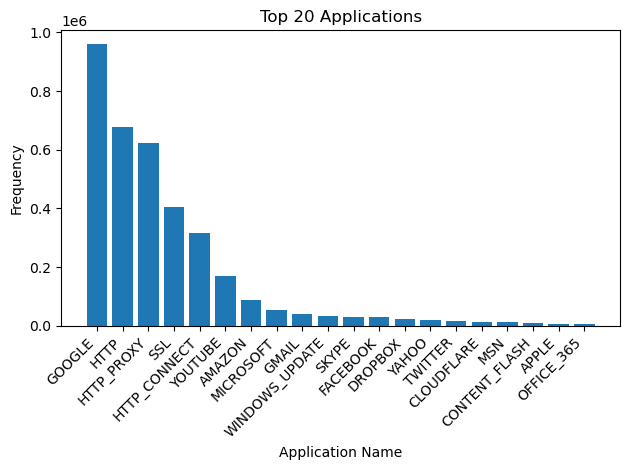

In [13]:
bar_top(20, data)

**Lets look at the top 20 applications**

In [14]:
top20 = []
freq_protocol = data['ProtocolName'].value_counts()
app_name = freq_protocol.index.tolist()
freq_count = freq_protocol.tolist()

for i in zip(app_name[:20], freq_count[:20]): 
    top20.append(i)

top20

[('GOOGLE', 959054),
 ('HTTP', 676987),
 ('HTTP_PROXY', 622007),
 ('SSL', 404822),
 ('HTTP_CONNECT', 317490),
 ('YOUTUBE', 170775),
 ('AMAZON', 86873),
 ('MICROSOFT', 54706),
 ('GMAIL', 40260),
 ('WINDOWS_UPDATE', 34470),
 ('SKYPE', 30654),
 ('FACEBOOK', 29014),
 ('DROPBOX', 25102),
 ('YAHOO', 21267),
 ('TWITTER', 18258),
 ('CLOUDFLARE', 14737),
 ('MSN', 14477),
 ('CONTENT_FLASH', 8589),
 ('APPLE', 7614),
 ('OFFICE_365', 5940)]

**To balance this a bit, we can sample data from applications, while taking all the data for the ones with smaller data**

Choosing 14k samples at random, mostly based on MSN application

In [15]:
# Taking a random sample of min(14000, count) data from the top 20 applications
# The number 14000 was randomly chosen based on 'MSN' application above.
listofDataFrames = []
for app, count in top20:
    listofDataFrames.append(pd.DataFrame(data[data['ProtocolName'] == app].sample(n = min(count, 10000))))

sampledData = pd.concat(listofDataFrames)
sampledData.shape

(192143, 77)

**This is a lot more balanced now**

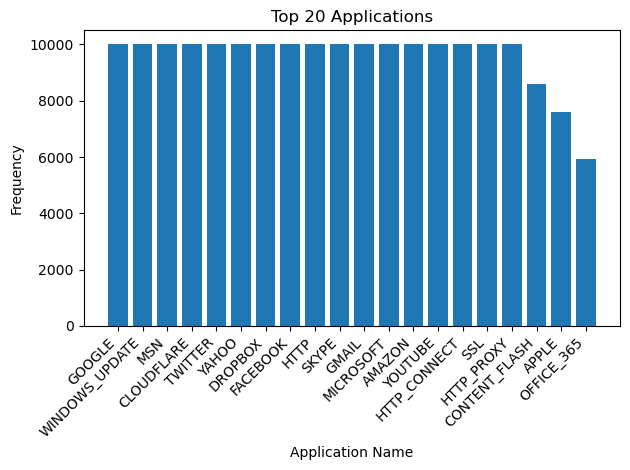

In [16]:
bar_top(20, sampledData)

In [17]:
sampledData

,Flow.ID,Source.IP,Source.Port,Destination.IP,Destination.Port,Protocol,Timestamp,Flow.Duration,Total.Fwd.Packets,Total.Backward.Packets,...,Active.Std,Active.Max,Active.Min,Idle.Mean,Idle.Std,Idle.Max,Idle.Min,Label,L7Protocol,ProtocolName
1614373,10.200.7.5-10.230.1.162-3128-61238-6,10.230.1.162,61238,10.200.7.5,3128,6,28/04/201709:45:57,14975652,1,3,...,0.00000,73.0,73.0,14975579.0,0.000000,14975579.0,14975579.0,BENIGN,126,GOOGLE
628283,10.200.7.217-64.233.186.189-50698-443-6,10.200.7.217,50698,64.233.186.189,443,6,27/04/201709:27:13,652387,11,12,...,0.00000,0.0,0.0,0.0,0.000000,0.0,0.0,BENIGN,126,GOOGLE
1886253,192.168.90.81-10.200.7.8-50030-3128-6,192.168.90.81,50030,10.200.7.8,3128,6,28/04/201710:12:00,33247127,82,73,...,0.00000,0.0,0.0,0.0,0.000000,0.0,0.0,BENIGN,126,GOOGLE
201150,172.217.30.3-10.200.7.218-443-52077-6,10.200.7.218,52077,172.217.30.3,443,6,26/04/201703:11:02,151164,1,2,...,0.00000,0.0,0.0,0.0,0.000000,0.0,0.0,BENIGN,126,GOOGLE
3307916,192.168.60.4-10.200.7.8-50252-3128-6,192.168.60.4,50252,10.200.7.8,3128,6,15/05/201711:04:09,91049914,20,27,...,884809.07926,1251571.0,262.0,44899040.5,146834.258647,45002868.0,44795213.0,BENIGN,126,GOOGLE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2518900,192.168.32.68-10.200.7.9-63554-3128-6,192.168.32.68,63554,10.200.7.9,3128,6,11/05/201709:59:59,6808,4,3,...,0.00000,0.0,0.0,0.0,0.000000,0.0,0.0,BENIGN,219,OFFICE_365
2195152,190.90.221.51-10.200.7.217-80-49059-6,10.200.7.217,49059,190.90.221.51,80,6,09/05/201711:33:31,105,1,1,...,0.00000,0.0,0.0,0.0,0.000000,0.0,0.0,BENIGN,219,OFFICE_365
460868,192.168.90.73-10.200.7.7-52170-3128-6,192.168.90.73,52170,10.200.7.7,3128,6,27/04/201707:55:46,230,1,1,...,0.00000,0.0,0.0,0.0,0.000000,0.0,0.0,BENIGN,219,OFFICE_365
1696789,192.168.72.97-10.200.7.6-49939-3128-6,192.168.72.97,49939,10.200.7.6,3128,6,28/04/201709:39:19,6712,4,3,...,0.00000,0.0,0.0,0.0,0.000000,0.0,0.0,BENIGN,219,OFFICE_365


**Reset index and shuffle the data so that all the apps are not clustered together**

Store the result into data now. This is what we will be using from now on

In [18]:
data = sampledData.sample(frac=1).reset_index(drop=True)
data

,Flow.ID,Source.IP,Source.Port,Destination.IP,Destination.Port,Protocol,Timestamp,Flow.Duration,Total.Fwd.Packets,Total.Backward.Packets,...,Active.Std,Active.Max,Active.Min,Idle.Mean,Idle.Std,Idle.Max,Idle.Min,Label,L7Protocol,ProtocolName
0,192.168.42.60-10.200.7.8-52295-3128-6,192.168.42.60,52295,10.200.7.8,3128,6,27/04/201710:42:01,569,1,1,...,0.000000,0.0,0.0,0.000000e+00,0.000000,0.0,0.0,BENIGN,68,MSN
1,192.168.220.165-10.200.7.5-50658-3128-6,192.168.220.165,50658,10.200.7.5,3128,6,26/04/201711:13:21,119434182,4,15,...,0.000000,0.0,0.0,0.000000e+00,0.000000,0.0,0.0,BENIGN,212,MICROSOFT
2,172.18.1.227-10.200.7.9-61237-3128-6,10.200.7.9,3128,172.18.1.227,61237,6,11/05/201710:02:38,31111846,285,0,...,0.000000,3742650.0,3742650.0,2.736916e+07,0.000000,27369163.0,27369163.0,BENIGN,122,GMAIL
3,192.168.32.18-10.200.7.9-54159-3128-6,192.168.32.18,54159,10.200.7.9,3128,6,27/04/201704:14:25,90247458,17,65,...,82018.379262,246194.0,1.0,1.000002e+07,4754.033814,10005615.0,9992451.0,BENIGN,130,HTTP_CONNECT
4,192.168.180.14-10.200.7.6-53854-3128-6,192.168.180.14,53854,10.200.7.6,3128,6,11/05/201709:59:58,84316513,6,3,...,0.000000,0.0,0.0,0.000000e+00,0.000000,0.0,0.0,BENIGN,119,FACEBOOK
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
192138,10.200.7.218-23.9.61.213-46851-443-6,10.200.7.218,46851,23.9.61.213,443,6,11/05/201703:33:49,326609,12,12,...,0.000000,0.0,0.0,0.000000e+00,0.000000,0.0,0.0,BENIGN,140,APPLE
192139,179.1.4.210-10.200.7.217-443-38851-6,10.200.7.217,38851,179.1.4.210,443,6,27/04/201709:08:32,4912361,47,37,...,0.000000,0.0,0.0,0.000000e+00,0.000000,0.0,0.0,BENIGN,124,YOUTUBE
192140,10.200.7.195-93.184.215.201-59511-443-6,10.200.7.195,59511,93.184.215.201,443,6,27/04/201704:59:31,118018088,14,15,...,190814.179117,378670.0,108818.0,5.873062e+07,239326.654054,58899846.0,58561387.0,BENIGN,125,SKYPE
192141,179.1.4.251-10.200.7.199-443-51248-6,10.200.7.199,51248,179.1.4.251,443,6,27/04/201704:10:42,8018092,16,12,...,0.000000,0.0,0.0,0.000000e+00,0.000000,0.0,0.0,BENIGN,124,YOUTUBE


**Data now has 192143 rows and 87 columns**

In [19]:
data.describe()

,Source.Port,Destination.Port,Protocol,Flow.Duration,Total.Fwd.Packets,Total.Backward.Packets,Total.Length.of.Fwd.Packets,Total.Length.of.Bwd.Packets,Fwd.Packet.Length.Max,Fwd.Packet.Length.Min,...,min_seg_size_forward,Active.Mean,Active.Std,Active.Max,Active.Min,Idle.Mean,Idle.Std,Idle.Max,Idle.Min,L7Protocol
count,192143.000000,192143.000000,192143.000000,1.921430e+05,192143.000000,192143.000000,1.921430e+05,1.921430e+05,192143.000000,192143.000000,...,192143.000000,1.921430e+05,1.921430e+05,1.921430e+05,1.921430e+05,1.921430e+05,1.921430e+05,1.921430e+05,1.921430e+05,192143.000000
mean,42678.088059,6975.893376,6.004122,2.265068e+07,61.380612,73.958328,3.234015e+04,1.094784e+05,521.574754,6.801851,...,27.233233,3.675513e+05,1.655061e+05,5.589846e+05,2.492390e+05,7.652294e+06,1.017476e+06,8.555773e+06,6.771804e+06,123.972146
std,18377.801394,15438.439141,0.212895,3.695611e+07,1104.565676,959.876502,1.367226e+06,1.793370e+06,984.113647,71.539734,...,5.985369,3.134882e+06,1.526809e+06,3.958056e+06,2.870982e+06,1.787273e+07,4.302664e+06,1.934873e+07,1.702420e+07,52.517847
min,80.000000,53.000000,6.000000,1.000000e+00,1.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,...,20.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,7.000000
25%,38332.000000,443.000000,6.000000,3.187500e+03,2.000000,1.000000,6.000000e+00,0.000000e+00,6.000000,0.000000,...,20.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,91.000000
50%,49864.000000,3128.000000,6.000000,7.248820e+05,6.000000,5.000000,5.100000e+02,6.110000e+02,270.000000,0.000000,...,32.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,124.000000
75%,54114.000000,3128.000000,6.000000,3.334501e+07,14.000000,15.000000,1.544000e+03,5.088000e+03,601.000000,0.000000,...,32.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,140.000000
max,65533.000000,65527.000000,17.000000,1.200000e+08,233033.000000,134496.000000,2.422878e+08,3.259112e+08,24820.000000,3871.000000,...,523.000000,1.115558e+08,7.005261e+07,1.115558e+08,1.115558e+08,1.199997e+08,7.289452e+07,1.199997e+08,1.199997e+08,220.000000


In [20]:
data.shape

(192143, 77)

In [21]:
data.info(show_counts=False)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 192143 entries, 0 to 192142
Data columns (total 77 columns):
 #   Column                       Dtype  
---  ------                       -----  
 0   Flow.ID                      object 
 1   Source.IP                    object 
 2   Source.Port                  int64  
 3   Destination.IP               object 
 4   Destination.Port             int64  
 5   Protocol                     int64  
 6   Timestamp                    object 
 7   Flow.Duration                int64  
 8   Total.Fwd.Packets            int64  
 9   Total.Backward.Packets       int64  
 10  Total.Length.of.Fwd.Packets  int64  
 11  Total.Length.of.Bwd.Packets  float64
 12  Fwd.Packet.Length.Max        int64  
 13  Fwd.Packet.Length.Min        int64  
 14  Fwd.Packet.Length.Mean       float64
 15  Fwd.Packet.Length.Std        float64
 16  Bwd.Packet.Length.Max        int64  
 17  Bwd.Packet.Length.Min        int64  
 18  Bwd.Packet.Length.Mean       float64
 19  Bw

**Encode the ProtocolName column using LabelEncoder**

In [22]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder().fit(data['ProtocolName'])
data['ProtocolLabel'] = le.transform(data['ProtocolName'])

In [23]:
data

,Flow.ID,Source.IP,Source.Port,Destination.IP,Destination.Port,Protocol,Timestamp,Flow.Duration,Total.Fwd.Packets,Total.Backward.Packets,...,Active.Max,Active.Min,Idle.Mean,Idle.Std,Idle.Max,Idle.Min,Label,L7Protocol,ProtocolName,ProtocolLabel
0,192.168.42.60-10.200.7.8-52295-3128-6,192.168.42.60,52295,10.200.7.8,3128,6,27/04/201710:42:01,569,1,1,...,0.0,0.0,0.000000e+00,0.000000,0.0,0.0,BENIGN,68,MSN,12
1,192.168.220.165-10.200.7.5-50658-3128-6,192.168.220.165,50658,10.200.7.5,3128,6,26/04/201711:13:21,119434182,4,15,...,0.0,0.0,0.000000e+00,0.000000,0.0,0.0,BENIGN,212,MICROSOFT,11
2,172.18.1.227-10.200.7.9-61237-3128-6,10.200.7.9,3128,172.18.1.227,61237,6,11/05/201710:02:38,31111846,285,0,...,3742650.0,3742650.0,2.736916e+07,0.000000,27369163.0,27369163.0,BENIGN,122,GMAIL,6
3,192.168.32.18-10.200.7.9-54159-3128-6,192.168.32.18,54159,10.200.7.9,3128,6,27/04/201704:14:25,90247458,17,65,...,246194.0,1.0,1.000002e+07,4754.033814,10005615.0,9992451.0,BENIGN,130,HTTP_CONNECT,9
4,192.168.180.14-10.200.7.6-53854-3128-6,192.168.180.14,53854,10.200.7.6,3128,6,11/05/201709:59:58,84316513,6,3,...,0.0,0.0,0.000000e+00,0.000000,0.0,0.0,BENIGN,119,FACEBOOK,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
192138,10.200.7.218-23.9.61.213-46851-443-6,10.200.7.218,46851,23.9.61.213,443,6,11/05/201703:33:49,326609,12,12,...,0.0,0.0,0.000000e+00,0.000000,0.0,0.0,BENIGN,140,APPLE,1
192139,179.1.4.210-10.200.7.217-443-38851-6,10.200.7.217,38851,179.1.4.210,443,6,27/04/201709:08:32,4912361,47,37,...,0.0,0.0,0.000000e+00,0.000000,0.0,0.0,BENIGN,124,YOUTUBE,19
192140,10.200.7.195-93.184.215.201-59511-443-6,10.200.7.195,59511,93.184.215.201,443,6,27/04/201704:59:31,118018088,14,15,...,378670.0,108818.0,5.873062e+07,239326.654054,58899846.0,58561387.0,BENIGN,125,SKYPE,14
192141,179.1.4.251-10.200.7.199-443-51248-6,10.200.7.199,51248,179.1.4.251,443,6,27/04/201704:10:42,8018092,16,12,...,0.0,0.0,0.000000e+00,0.000000,0.0,0.0,BENIGN,124,YOUTUBE,19


**Remove unwanted columns**

- Flow.ID
- Source.IP
- Source.Port
- Destination.IP
- Destination.Port
- Label
- Timestamp
- Source.Port
- Protocol

In [24]:
dataset = data.drop(['Flow.ID','Source.IP','Label', 'Timestamp', 'Source.Port', 'Destination.IP', 'Destination.Port', 'Protocol'], axis=1)

**Remove columns that only have a 0 value**

In [25]:
type(unique_df.index)
for i, row in unique_df.iterrows():
    if row.loc['unique'][0] == 0:
       dataset = dataset.drop([i], axis=1)

**Scale and split into train and test data**

In [26]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

x_dataset = dataset.drop(['ProtocolName', 'ProtocolLabel'], axis = 1)
y_dataset = dataset['ProtocolLabel']
scaler = StandardScaler()

# normal dataset
X_train, X_test, y_train, y_test = train_test_split(x_dataset, y_dataset, test_size=0.2)
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [27]:
X_train.shape, X_test.shape

((153714, 52), (38429, 52))

**Correlation Matrix**

In [28]:
correlation_matrix = dataset.drop(['ProtocolName'], axis=1).corr()
correlation_matrix

,Flow.Duration,Total.Fwd.Packets,Total.Backward.Packets,Total.Length.of.Fwd.Packets,Total.Length.of.Bwd.Packets,Fwd.Packet.Length.Max,Fwd.Packet.Length.Min,Fwd.Packet.Length.Mean,Bwd.Packet.Length.Max,Bwd.Packet.Length.Min,...,Subflow.Fwd.Packets,Subflow.Fwd.Bytes,Subflow.Bwd.Packets,Subflow.Bwd.Bytes,Init_Win_bytes_forward,Init_Win_bytes_backward,act_data_pkt_fwd,min_seg_size_forward,L7Protocol,ProtocolLabel
Flow.Duration,1.000000,0.085993,0.109430,0.049681,0.083994,0.216343,0.090792,0.223535,0.161201,0.206254,...,0.085993,0.049681,0.109430,0.083994,-0.024496,0.049420,0.066841,0.001630,0.088129,-0.007242
Total.Fwd.Packets,0.085993,1.000000,0.710130,0.735727,0.501087,0.220115,0.016740,0.102651,0.121786,-0.000572,...,1.000000,0.735727,0.710130,0.501087,0.002777,0.043764,0.787577,0.010166,0.021262,0.019375
Total.Backward.Packets,0.109430,0.710130,1.000000,0.345354,0.763205,0.130044,0.014067,0.057090,0.239748,-0.001885,...,0.710130,0.345354,1.000000,0.763205,0.004794,0.040542,0.480027,0.010671,0.025268,0.034691
Total.Length.of.Fwd.Packets,0.049681,0.735727,0.345354,1.000000,-0.000088,0.294451,0.024409,0.156685,-0.007610,-0.003834,...,0.735727,1.000000,0.345354,-0.000088,-0.011878,0.046527,0.934895,0.004925,0.015084,0.003078
Total.Length.of.Bwd.Packets,0.083994,0.501087,0.763205,-0.000088,1.000000,0.014039,-0.005515,-0.025102,0.300972,0.001748,...,0.501087,-0.000088,0.763205,1.000000,0.011922,0.001771,0.104783,0.012293,0.022912,0.044597
Fwd.Packet.Length.Max,0.216343,0.220115,0.130044,0.294451,0.014039,1.000000,0.124155,0.812332,0.162233,-0.040755,...,0.220115,0.294451,0.130044,0.014039,0.080108,0.061861,0.273795,0.035732,0.036214,0.053855
Fwd.Packet.Length.Min,0.090792,0.016740,0.014067,0.024409,-0.005515,0.124155,1.000000,0.380471,-0.049675,-0.002536,...,0.016740,0.024409,0.014067,-0.005515,-0.051511,0.025230,0.024206,0.009371,0.031519,0.004945
Fwd.Packet.Length.Mean,0.223535,0.102651,0.057090,0.156685,-0.025102,0.812332,0.380471,1.000000,-0.002129,0.003334,...,0.102651,0.156685,0.057090,-0.025102,0.024354,0.067505,0.141799,0.025055,0.057752,0.009144
Bwd.Packet.Length.Max,0.161201,0.121786,0.239748,-0.007610,0.300972,0.162233,-0.049675,-0.002129,1.000000,0.004562,...,0.121786,-0.007610,0.239748,0.300972,0.184291,0.009416,0.035706,-0.024510,0.064665,0.190787
Bwd.Packet.Length.Min,0.206254,-0.000572,-0.001885,-0.003834,0.001748,-0.040755,-0.002536,0.003334,0.004562,1.000000,...,-0.000572,-0.003834,-0.001885,0.001748,-0.102287,-0.002362,-0.004423,0.104943,0.001357,-0.119644


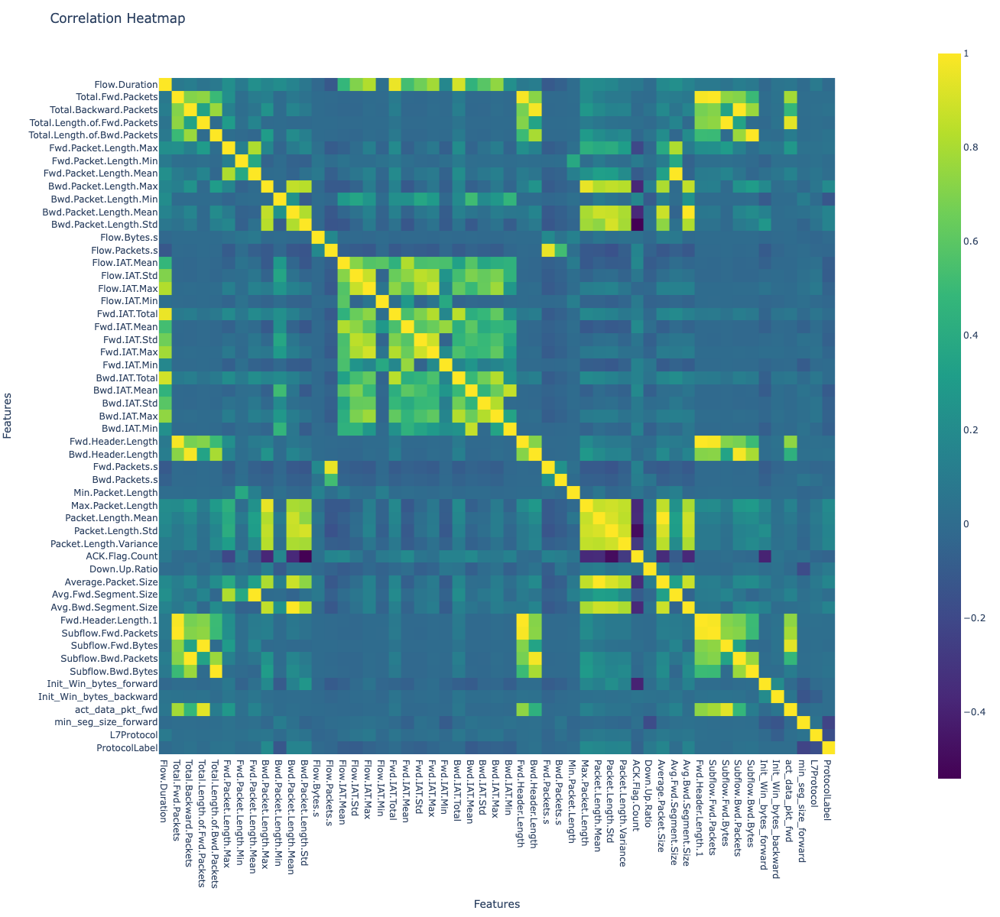

In [29]:
import plotly.express as px


# Create a heatmap figure using Plotly
fig = px.imshow(correlation_matrix, color_continuous_scale='viridis')

# Set axis labels and title
fig.update_xaxes(title_text='Features')
fig.update_yaxes(title_text='Features')
fig.update_layout(
    title='Correlation Heatmap',
    height=1200,  # Set the height of the figure
    width=1200    # Set the width of the figure
)

# Save the plot as an HTML file
fig.write_html('images/correlation_heatmap.html')

# Display the plot (optional)
fig.show()
fig.write_image('images/heatmap.png')

**Observation from correlation heatmap**

- Most of the features are mostly in the same color band range (approx +0.2 to -0.2)

# Principal Component Analysis

Doing PCA with 10 components

In [30]:
from sklearn.decomposition import PCA

pca = PCA(n_components=10)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

print(X_train_pca.shape, X_test_pca.shape)

(153714, 10) (38429, 10)


# Feature Selection using correlation

In [31]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import make_column_transformer
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier, export_text
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import confusion_matrix, precision_score, recall_score, accuracy_score, ConfusionMatrixDisplay
from sklearn.metrics import classification_report


warnings.simplefilter(action='ignore', category=FutureWarning)

from sklearn import set_config
set_config(display="diagram")

In [32]:
# choosing the best 1-29 features from same correlated values
sorted_corr_matrix_protocolName = correlation_matrix['ProtocolLabel'].abs().sort_values(ascending=False)

# Get the top 29 correlated features
final_features= sorted_corr_matrix_protocolName[1:30]  # Exclude the 'ProtocolName' itself

print("Top 29 features with the highest absolute correlation with ProtocolName: \n")
print(final_features.index.tolist())

pos_value_columns = final_features

Top 29 features with the highest absolute correlation with ProtocolName: 

['min_seg_size_forward', 'Bwd.Packet.Length.Max', 'Max.Packet.Length', 'Packet.Length.Mean', 'Average.Packet.Size', 'Packet.Length.Variance', 'L7Protocol', 'Packet.Length.Std', 'Avg.Bwd.Segment.Size', 'Bwd.Packet.Length.Mean', 'Bwd.Packet.Length.Std', 'Bwd.Packet.Length.Min', 'Bwd.IAT.Mean', 'Down.Up.Ratio', 'Flow.IAT.Std', 'Flow.IAT.Mean', 'Bwd.IAT.Min', 'Fwd.IAT.Std', 'Bwd.IAT.Std', 'Bwd.IAT.Max', 'Fwd.Packet.Length.Max', 'ACK.Flag.Count', 'Fwd.IAT.Mean', 'Flow.IAT.Max', 'Subflow.Bwd.Bytes', 'Total.Length.of.Bwd.Packets', 'Bwd.Header.Length', 'Total.Backward.Packets', 'Subflow.Bwd.Packets']


In [33]:
# Choose the top 29 features with the highest absolute correlation with ProtocolName
top_29_features = sorted_corr_matrix_protocolName.index[1:30]

# Create a DataFrame with these selected features and a copy of the 'ProtocolName' column
data_for_prediction_featureSelection = data[top_29_features].copy()
data_for_prediction_featureSelection['ProtocolName'] = data['ProtocolName']
data_for_prediction_featureSelection['ProtocolLabel'] = data['ProtocolLabel']

corrx_dataset = data_for_prediction_featureSelection.drop(['ProtocolName', 'ProtocolLabel'], axis = 1)
corry_dataset = data_for_prediction_featureSelection['ProtocolLabel']
scaler = StandardScaler()


# Split the data for feature selection via correlation matrix
X_train_corr, X_test_corr, y_train_corr, y_test_corr = train_test_split(corrx_dataset, corry_dataset, test_size=0.2)

# Standardize the features
sc = StandardScaler()
X_train_corr = sc.fit_transform(X_train_corr)
X_test_corr = sc.transform(X_test_corr)

In [34]:
X_train_corr.shape, X_test_corr.shape

((153714, 29), (38429, 29))

# Common code

In [35]:
from sklearn.metrics import confusion_matrix

def draw_confusion_matrix(ytest, pred, title, figname):
    classes = le.classes_.tolist()
    cm = confusion_matrix(ytest, pred)

    # Create a Plotly figure for the confusion matrix
    fig = ff.create_annotated_heatmap(
        z=cm,
        x=classes,
        y=classes,
        colorscale='Viridis')

    # Customize the layout
    fig.update_layout(
        title_text=f'Confusion Matrix for {title}',
        title_y=1,
        #xaxis_title='Predicted',
        yaxis_title='Actual',
        autosize=False,
        width=800,
        height=600)
    # Display the confusion matrix (optional)
    fig.show()
    fig.write_image('images/' + figname + '.png')

In [36]:
from sklearn.metrics import classification_report

def draw_classification_report(ytest, pred, title):
    classes = le.classes_.tolist()

    # Calculate the classification report
    report = classification_report(ytest, pred, target_names=classes, output_dict=True)

    # Convert the classification report to a DataFrame for formatting
    df_report = pd.DataFrame(report).transpose()

    # Display the classification report
    df1 = df_report.style.set_caption(title).set_table_styles([{
    'selector': 'caption',
    'props': [
        ('color', 'black'),
        ('font-size', '18px')
    ]}])

    display(df1)

# Logistic Regression

In [37]:
def logistic_regression(Xtrain, ytrain):
    lr = LogisticRegression(random_state=0, solver='saga', max_iter=100)
    lr.fit(Xtrain, ytrain)
    return lr

In [38]:
# logistic regression on PCA dataset
lr = logistic_regression(X_train_pca, y_train)

/Users/venkit/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



In [39]:
# logistic regression on post-correlation matrix data
lr_corr = logistic_regression(X_train_corr, y_train_corr)

/Users/venkit/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



In [40]:
lr_pred = lr.predict(X_test_pca)
print('Accuracy in Logistic Regression on PCA Dataset', lr.score(X_test_pca, y_test))
lr_corr_pred = lr_corr.predict(X_test_corr)
print('Accuracy in Logistic Regression on Feature Selection via Correlation Matrix', lr_corr.score(X_test_corr, y_test_corr))

Accuracy in Logistic Regression on PCA Dataset 0.266361341695074
Accuracy in Logistic Regression on Feature Selection via Correlation Matrix 0.4812771604777642


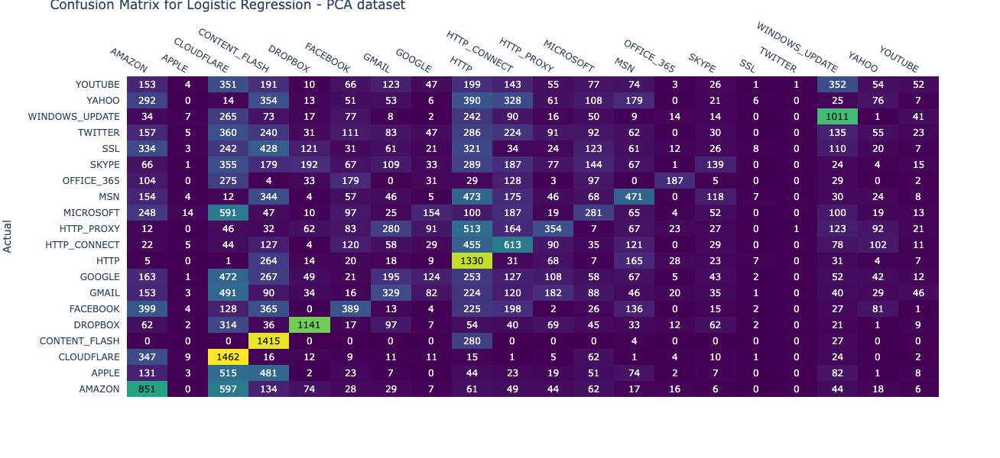

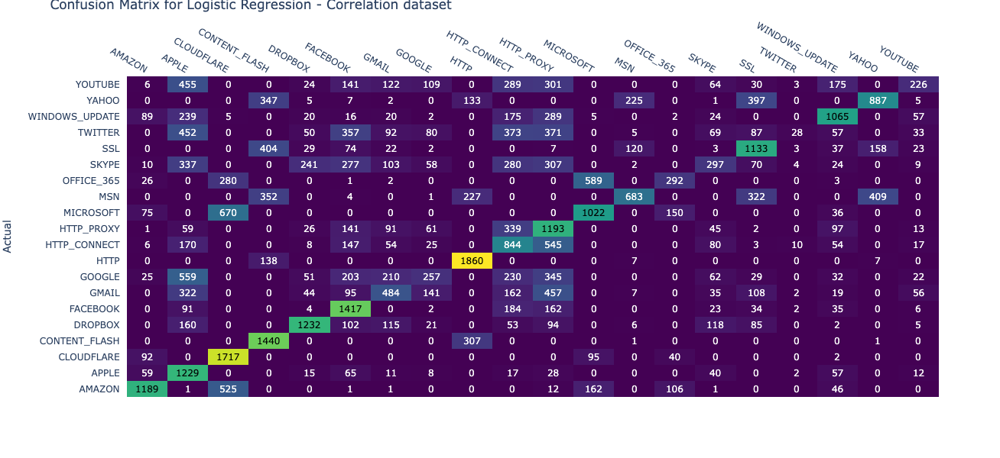

In [41]:
draw_confusion_matrix(y_test, lr_pred, 'Logistic Regression - PCA dataset', 'lr-pca')
draw_confusion_matrix(y_test_corr, lr_corr_pred, 'Logistic Regression - Correlation dataset', 'lr-corr')

In [42]:
draw_classification_report(y_test, lr_pred, 'Logistic Regression - PCA dataset')
draw_classification_report(y_test_corr, lr_corr_pred, 'Logistic Regression - Correlation dataset')

,precision,recall,f1-score,support
AMAZON,0.230811,0.416544,0.297033,2043.000000
APPLE,0.046154,0.002037,0.003901,1473.000000
CLOUDFLARE,0.223718,0.730270,0.342509,2002.000000
CONTENT_FLASH,0.278160,0.819815,0.415382,1726.000000
DROPBOX,0.625891,0.563735,0.593189,2024.000000
FACEBOOK,0.266074,0.193052,0.223756,2015.000000
GMAIL,0.212945,0.162149,0.184107,2029.000000
GOOGLE,0.174648,0.060165,0.089498,2061.000000
HTTP,0.229984,0.654528,0.340371,2032.000000
HTTP_CONNECT,0.214186,0.315492,0.255151,1943.000000


,precision,recall,f1-score,support
AMAZON,0.753485,0.581703,0.656543,2044.000000
APPLE,0.301669,0.796500,0.437600,1543.000000
CLOUDFLARE,0.537066,0.882323,0.667704,1946.000000
CONTENT_FLASH,0.537113,0.823328,0.650113,1749.000000
DROPBOX,0.704403,0.618164,0.658471,1993.000000
FACEBOOK,0.464895,0.722959,0.565895,1960.000000
GMAIL,0.364184,0.250518,0.296841,1932.000000
GOOGLE,0.335072,0.126914,0.184097,2025.000000
HTTP,0.736051,0.924453,0.819564,2012.000000
HTTP_CONNECT,0.286490,0.429954,0.343858,1963.000000


# Decision Tree

In [43]:
def decisiontree(Xtrain, ytrain):
    dt = DecisionTreeClassifier(criterion='entropy', max_depth=3, random_state=42)
    dt.fit(Xtrain, ytrain)
    return dt

In [44]:
# PCA dataset
dt = decisiontree(X_train_pca, y_train)

In [45]:
# post-correlation matrix data
dt_corr = decisiontree(X_train_corr, y_train_corr)

In [46]:
dt_pred = dt.predict(X_test_pca)
print('Accuracy in DecisionTree on PCA Dataset', dt.score(X_test_pca, y_test))
dt_corr_pred = dt_corr.predict(X_test_corr)
print('Accuracy in DecisionTree on Feature Selection via Correlation Matrix', dt_corr.score(X_test_corr, y_test_corr))

Accuracy in DecisionTree on PCA Dataset 0.188269275807333
Accuracy in DecisionTree on Feature Selection via Correlation Matrix 0.4120586015769341


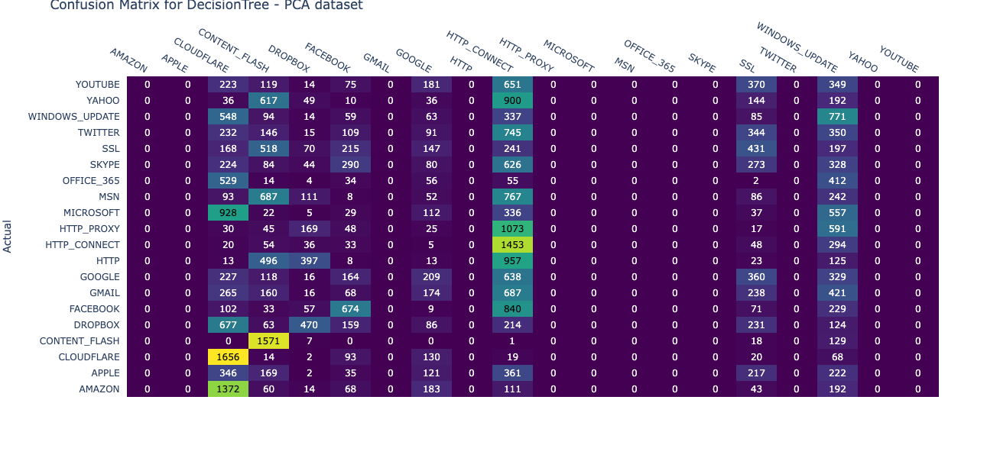

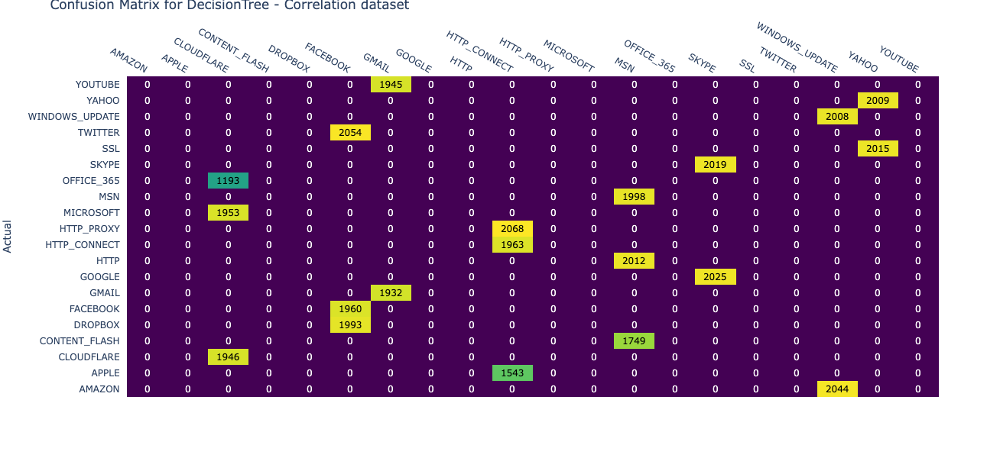

In [47]:
draw_confusion_matrix(y_test, dt_pred, 'DecisionTree - PCA dataset', 'dt-pca')
draw_confusion_matrix(y_test_corr, dt_corr_pred, 'DecisionTree - Correlation dataset', 'dt-corr')

In [48]:
draw_classification_report(y_test, dt_pred, 'DecisionTree - PCA dataset')
draw_classification_report(y_test_corr, dt_corr_pred, 'DecisionTree - Correlation dataset')

/Users/venkit/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/venkit/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/venkit/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



,precision,recall,f1-score,support
AMAZON,0.000000,0.000000,0.000000,2043.000000
APPLE,0.000000,0.000000,0.000000,1473.000000
CLOUDFLARE,0.215373,0.827173,0.341760,2002.000000
CONTENT_FLASH,0.309009,0.910197,0.461380,1726.000000
DROPBOX,0.310847,0.232213,0.265837,2024.000000
FACEBOOK,0.309316,0.334491,0.321412,2015.000000
GMAIL,0.000000,0.000000,0.000000,2029.000000
GOOGLE,0.117879,0.101407,0.109025,2061.000000
HTTP,0.000000,0.000000,0.000000,2032.000000
HTTP_CONNECT,0.131947,0.747813,0.224315,1943.000000


/Users/venkit/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/venkit/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/venkit/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



,precision,recall,f1-score,support
AMAZON,0.000000,0.000000,0.000000,2044.000000
APPLE,0.000000,0.000000,0.000000,1543.000000
CLOUDFLARE,0.382168,1.000000,0.552998,1946.000000
CONTENT_FLASH,0.000000,0.000000,0.000000,1749.000000
DROPBOX,0.000000,0.000000,0.000000,1993.000000
FACEBOOK,0.326286,1.000000,0.492030,1960.000000
GMAIL,0.498323,1.000000,0.665175,1932.000000
GOOGLE,0.000000,0.000000,0.000000,2025.000000
HTTP,0.000000,0.000000,0.000000,2012.000000
HTTP_CONNECT,0.352171,1.000000,0.520897,1963.000000


# SVM

In [49]:
def svmfit(Xtrain, ytrain):
    svm = SVC(kernel='rbf', random_state=42)
    svm.fit(Xtrain, ytrain)
    return svm

In [50]:
# PCA dataset
svm = svmfit(X_train_pca, y_train)

In [51]:
# post-correlation matrix data
svm_corr = svmfit(X_train_corr, y_train_corr)

In [52]:
svm_pred = svm.predict(X_test_pca)
print('Accuracy in SVM on PCA Dataset', svm.score(X_test_pca, y_test))
svm_corr_pred = svm_corr.predict(X_test_corr)
print('Accuracy in SVM on Feature Selection via Correlation Matrix', svm_corr.score(X_test_corr, y_test_corr))

Accuracy in SVM on PCA Dataset 0.48458195633505946
Accuracy in SVM on Feature Selection via Correlation Matrix 0.790756980405423


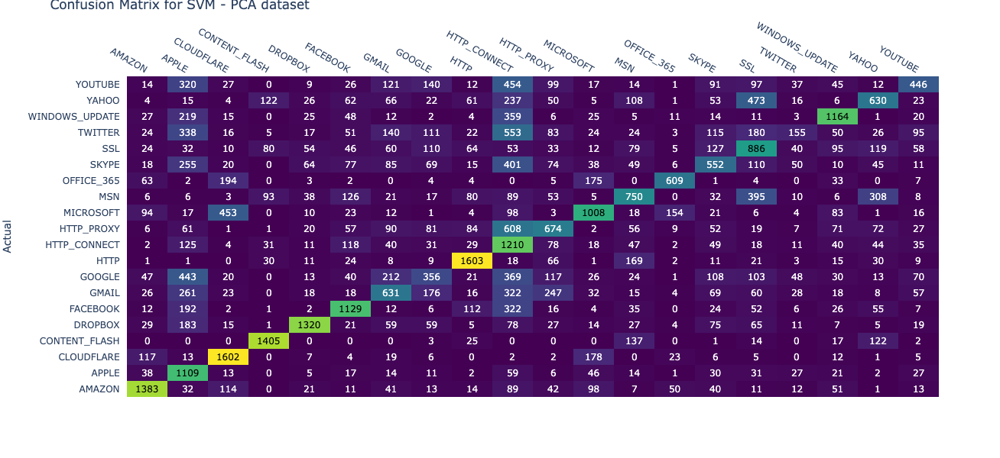

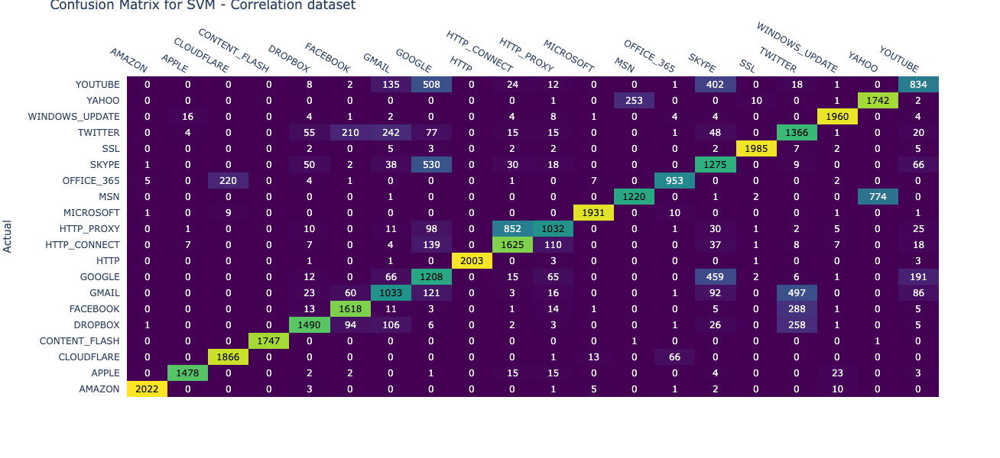

,precision,recall,f1-score,support
AMAZON,0.714729,0.676946,0.695324,2043.000000
APPLE,0.306015,0.752885,0.435158,1473.000000
CLOUDFLARE,0.631703,0.800200,0.706038,2002.000000
CONTENT_FLASH,0.794234,0.814021,0.804006,1726.000000
DROPBOX,0.788530,0.652174,0.713899,2024.000000
FACEBOOK,0.594211,0.560298,0.576756,2015.000000
GMAIL,0.384054,0.310991,0.343682,2029.000000
GOOGLE,0.290139,0.172732,0.216545,2061.000000
HTTP,0.736334,0.788878,0.761701,2032.000000
HTTP_CONNECT,0.227401,0.622748,0.333150,1943.000000


,precision,recall,f1-score,support
AMAZON,0.996059,0.989237,0.992636,2044.000000
APPLE,0.981408,0.957874,0.969498,1543.000000
CLOUDFLARE,0.890692,0.958890,0.923534,1946.000000
CONTENT_FLASH,1.000000,0.998856,0.999428,1749.000000
DROPBOX,0.884798,0.747617,0.810443,1993.000000
FACEBOOK,0.813065,0.825510,0.819241,1960.000000
GMAIL,0.624169,0.534679,0.575969,1932.000000
GOOGLE,0.448404,0.596543,0.511973,2025.000000
HTTP,1.000000,0.995527,0.997758,2012.000000
HTTP_CONNECT,0.627655,0.827815,0.713972,1963.000000


In [53]:
draw_confusion_matrix(y_test, svm_pred, 'SVM - PCA dataset', 'svm-pca')
draw_confusion_matrix(y_test_corr, svm_corr_pred, 'SVM - Correlation dataset', 'svm-corr')

draw_classification_report(y_test, svm_pred, 'SVM - PCA dataset')
draw_classification_report(y_test_corr, svm_corr_pred, 'SVM - Correlation dataset')

# KNN

In [54]:
def knnfit(Xtrain, ytrain):
    knn = KNeighborsClassifier(n_neighbors=5)
    knn.fit(Xtrain, ytrain)
    return knn

In [55]:
# PCA dataset
knn = knnfit(X_train_pca, y_train)

In [56]:
# post-correlation matrix data
knn_corr = knnfit(X_train_corr, y_train_corr)

In [57]:
knn_pred = knn.predict(X_test_pca)
print('Accuracy in KNN on PCA Dataset', knn.score(X_test_pca, y_test))
knn_corr_pred = knn_corr.predict(X_test_corr)
print('Accuracy in KNN on Feature Selection via Correlation Matrix', knn_corr.score(X_test_corr, y_test_corr))

Accuracy in KNN on PCA Dataset 0.6793307137838611
Accuracy in KNN on Feature Selection via Correlation Matrix 0.8355148455593432


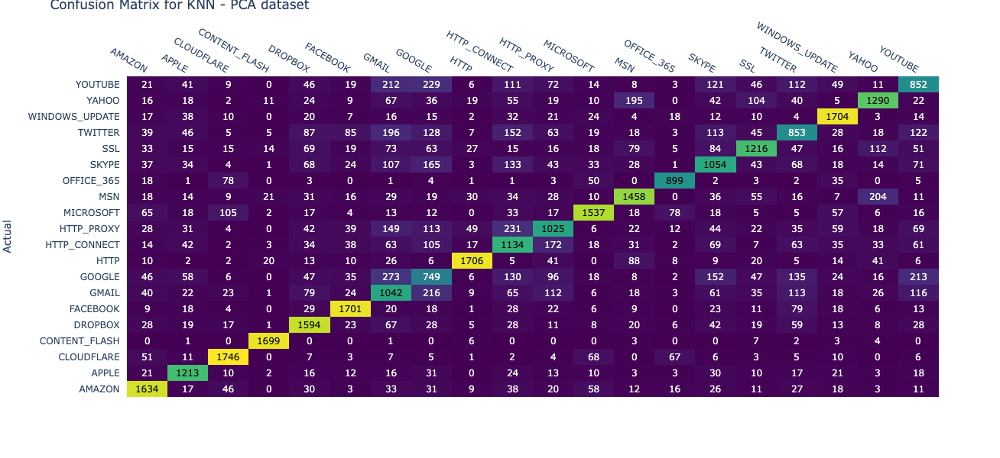

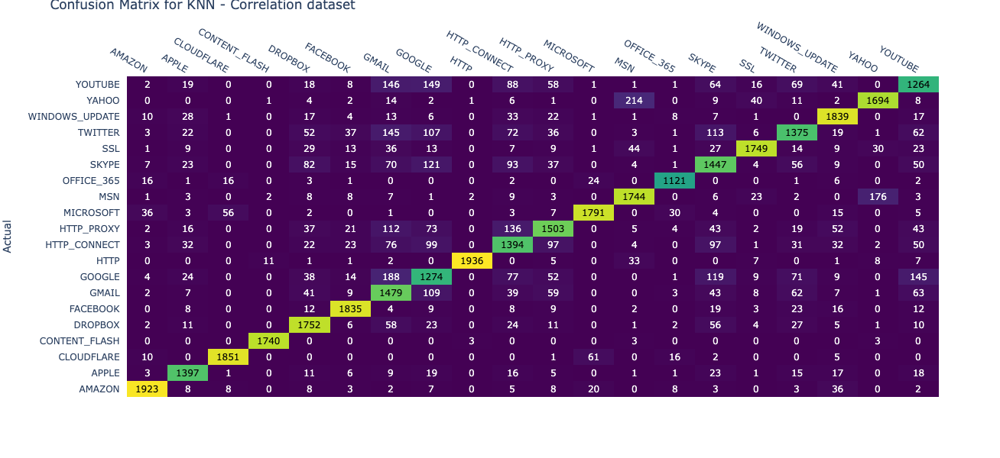

,precision,recall,f1-score,support
AMAZON,0.761772,0.799804,0.780325,2043.000000
APPLE,0.731163,0.823489,0.774585,1473.000000
CLOUDFLARE,0.832618,0.872128,0.851915,2002.000000
CONTENT_FLASH,0.954494,0.984357,0.969196,1726.000000
DROPBOX,0.706560,0.787549,0.744860,2024.000000
FACEBOOK,0.821342,0.844169,0.832599,2015.000000
GMAIL,0.432186,0.513553,0.469369,2029.000000
GOOGLE,0.379625,0.363416,0.371344,2061.000000
HTTP,0.896008,0.839567,0.866870,2032.000000
HTTP_CONNECT,0.503776,0.583634,0.540773,1943.000000


,precision,recall,f1-score,support
AMAZON,0.949630,0.940802,0.945195,2044.000000
APPLE,0.867163,0.905379,0.885859,1543.000000
CLOUDFLARE,0.957579,0.951182,0.954370,1946.000000
CONTENT_FLASH,0.992018,0.994854,0.993434,1749.000000
DROPBOX,0.819841,0.879077,0.848426,1993.000000
FACEBOOK,0.914756,0.936224,0.925366,1960.000000
GMAIL,0.626164,0.765528,0.688868,1932.000000
GOOGLE,0.633201,0.629136,0.631162,2025.000000
HTTP,0.996910,0.962227,0.979262,2012.000000
HTTP_CONNECT,0.692843,0.710138,0.701384,1963.000000


In [58]:
draw_confusion_matrix(y_test, knn_pred, 'KNN - PCA dataset', 'knn-pca')
draw_confusion_matrix(y_test_corr, knn_corr_pred, 'KNN - Correlation dataset', 'knn-corr')

draw_classification_report(y_test, knn_pred, 'KNN - PCA dataset')
draw_classification_report(y_test_corr, knn_corr_pred, 'KNN - Correlation dataset')

# Naive Bayes

In [59]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import GaussianNB
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

def nb_fit(Xtrain, ytrain):
    nb = GaussianNB()
    nb.fit(Xtrain, ytrain)
    return nb

In [60]:
# PCA dataset
nb = nb_fit(X_train_pca, y_train)

In [61]:
# post-correlation matrix data
nb_corr = nb_fit(X_train_corr, y_train_corr)

In [62]:
nb_pred = nb.predict(X_test_pca)
print('Accuracy in NaiveBayes on PCA Dataset', nb.score(X_test_pca, y_test))
nb_corr_pred = nb_corr.predict(X_test_corr)
print('Accuracy in NaiveBayes on Feature Selection via Correlation Matrix', nb_corr.score(X_test_corr, y_test_corr))

Accuracy in NaiveBayes on PCA Dataset 0.21832470269848292
Accuracy in NaiveBayes on Feature Selection via Correlation Matrix 0.9999739779853756


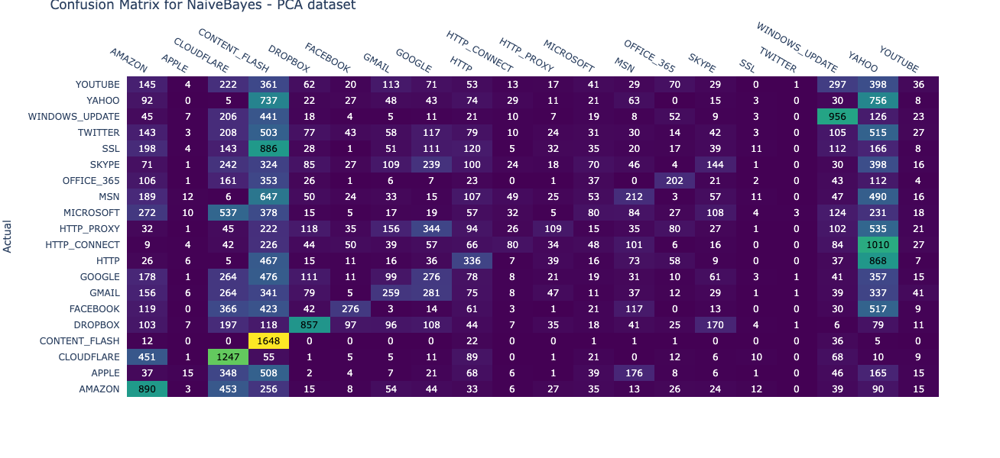

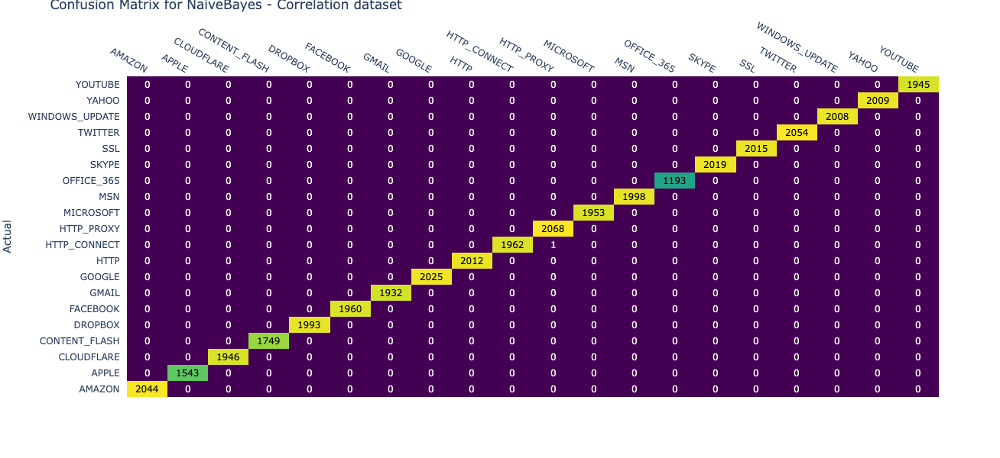

,precision,recall,f1-score,support
AMAZON,0.271839,0.435634,0.334775,2043.000000
APPLE,0.174419,0.010183,0.019243,1473.000000
CLOUDFLARE,0.251361,0.622877,0.358179,2002.000000
CONTENT_FLASH,0.175880,0.954809,0.297044,1726.000000
DROPBOX,0.514097,0.423419,0.464373,2024.000000
FACEBOOK,0.422018,0.136973,0.206819,2015.000000
GMAIL,0.220613,0.127649,0.161723,2029.000000
GOOGLE,0.151233,0.133916,0.142048,2061.000000
HTTP,0.210000,0.165354,0.185022,2032.000000
HTTP_CONNECT,0.247678,0.041173,0.070609,1943.000000


,precision,recall,f1-score,support
AMAZON,1.000000,1.000000,1.000000,2044.000000
APPLE,1.000000,1.000000,1.000000,1543.000000
CLOUDFLARE,1.000000,1.000000,1.000000,1946.000000
CONTENT_FLASH,1.000000,1.000000,1.000000,1749.000000
DROPBOX,1.000000,1.000000,1.000000,1993.000000
FACEBOOK,1.000000,1.000000,1.000000,1960.000000
GMAIL,1.000000,1.000000,1.000000,1932.000000
GOOGLE,1.000000,1.000000,1.000000,2025.000000
HTTP,1.000000,1.000000,1.000000,2012.000000
HTTP_CONNECT,1.000000,0.999491,0.999745,1963.000000


In [63]:
draw_confusion_matrix(y_test, nb_pred, 'NaiveBayes - PCA dataset', 'nb-pca')
draw_confusion_matrix(y_test_corr, nb_corr_pred, 'NaiveBayes - Correlation dataset', 'nb-corr')

draw_classification_report(y_test, nb_pred, 'NaiveBayes - PCA dataset')
draw_classification_report(y_test_corr, nb_corr_pred, 'NaiveBayes - Correlation dataset')

# Random Forest Classifier

In [64]:
from sklearn.ensemble import RandomForestClassifier

def random_forest_fit(Xtrain, ytrain):
    rf = RandomForestClassifier(n_estimators=200)
    rf.fit(Xtrain, ytrain)
    return rf

In [65]:
# PCA dataset
rf = random_forest_fit(X_train_pca, y_train)

In [66]:
# post-correlation matrix data
rf_corr = random_forest_fit(X_train_corr, y_train_corr)

In [67]:
rf_pred = rf.predict(X_test_pca)
print('Accuracy in RandomForest on PCA Dataset', rf.score(X_test_pca, y_test))
rf_corr_pred = rf_corr.predict(X_test_corr)
print('Accuracy in RandomForest on Feature Selection via Correlation Matrix', rf_corr.score(X_test_corr, y_test_corr))

Accuracy in RandomForest on PCA Dataset 0.7593223867391814
Accuracy in RandomForest on Feature Selection via Correlation Matrix 0.9767363189258113


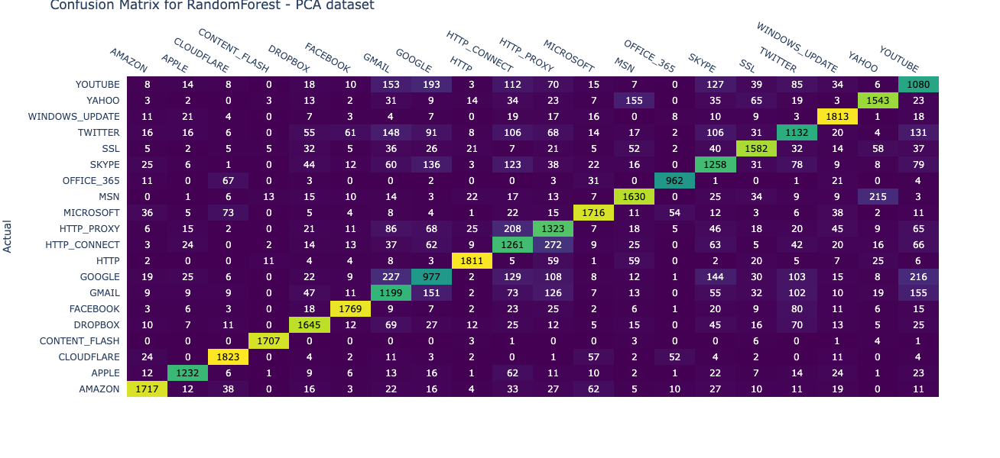

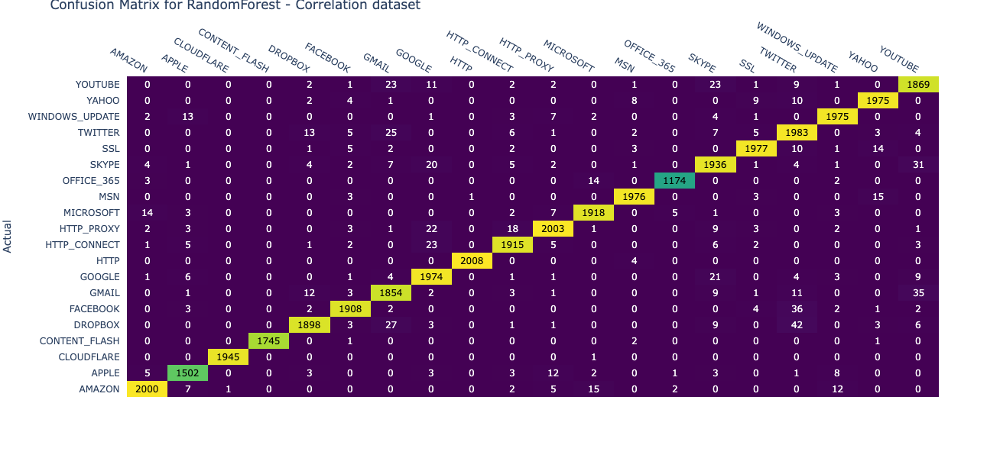

,precision,recall,f1-score,support
AMAZON,0.894271,0.840431,0.866515,2043.000000
APPLE,0.881890,0.836388,0.858537,1473.000000
CLOUDFLARE,0.881528,0.910589,0.895823,2002.000000
CONTENT_FLASH,0.979908,0.988992,0.984429,1726.000000
DROPBOX,0.825803,0.812747,0.819223,2024.000000
FACEBOOK,0.908577,0.877916,0.892983,2015.000000
GMAIL,0.561593,0.590931,0.575889,2029.000000
GOOGLE,0.542476,0.474042,0.505955,2061.000000
HTTP,0.931105,0.891240,0.910737,2032.000000
HTTP_CONNECT,0.557965,0.648996,0.600048,1943.000000


,precision,recall,f1-score,support
AMAZON,0.984252,0.978474,0.981354,2044.000000
APPLE,0.972798,0.973428,0.973113,1543.000000
CLOUDFLARE,0.999486,0.999486,0.999486,1946.000000
CONTENT_FLASH,1.000000,0.997713,0.998855,1749.000000
DROPBOX,0.979360,0.952333,0.965658,1993.000000
FACEBOOK,0.982998,0.973469,0.978211,1960.000000
GMAIL,0.952724,0.959627,0.956163,1932.000000
GOOGLE,0.958718,0.974815,0.966699,2025.000000
HTTP,0.999502,0.998012,0.998757,2012.000000
HTTP_CONNECT,0.975548,0.975548,0.975548,1963.000000


In [68]:
draw_confusion_matrix(y_test, rf_pred, 'RandomForest - PCA dataset', 'rfc-pca')
draw_confusion_matrix(y_test_corr, rf_corr_pred, 'RandomForest - Correlation dataset', 'rfc-corr')

draw_classification_report(y_test, rf_pred, 'RandomForest - PCA dataset')
draw_classification_report(y_test_corr, rf_corr_pred, 'RandomForest - Correlation dataset')

/Users/venkit/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/venkit/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/venkit/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/venkit/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in lab

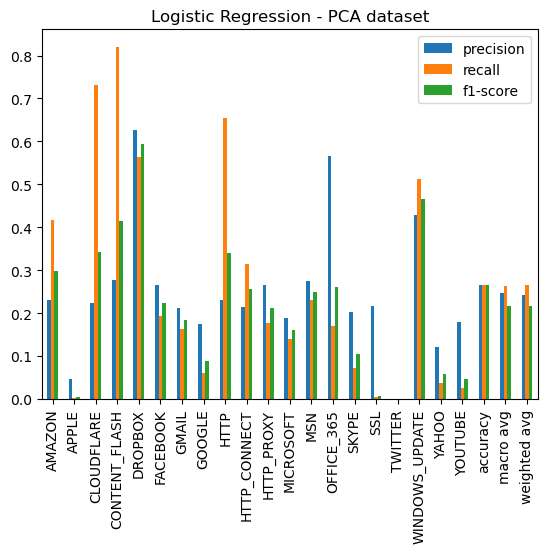

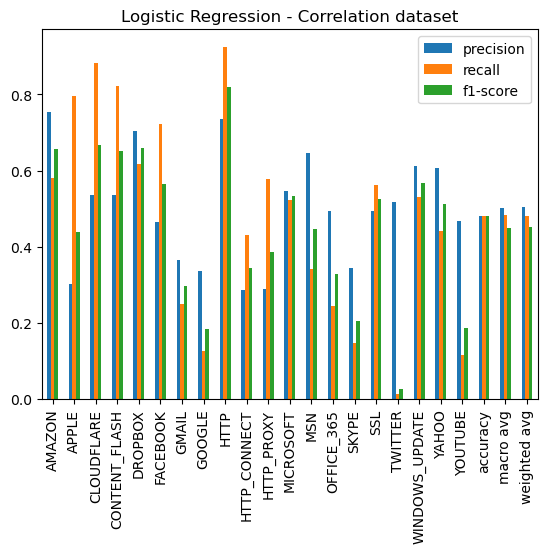

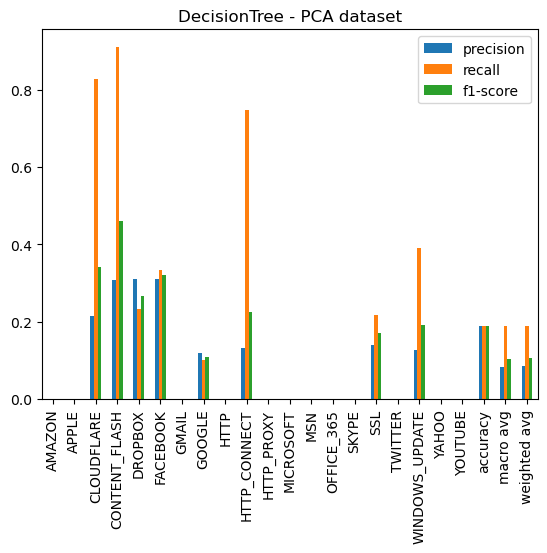

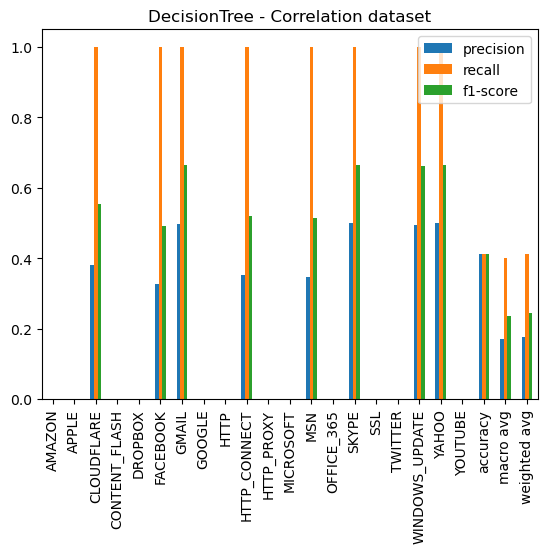

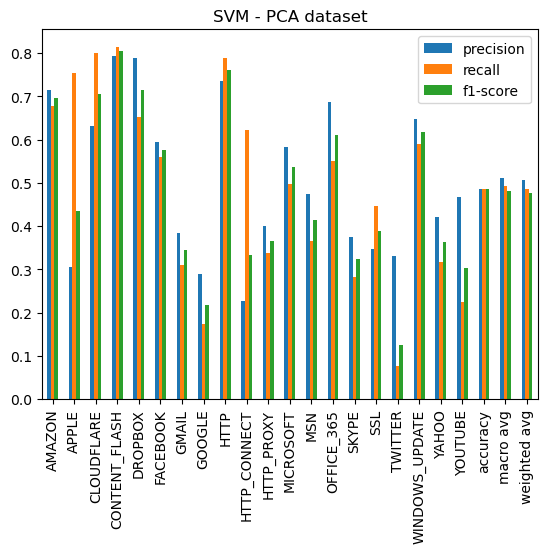

...

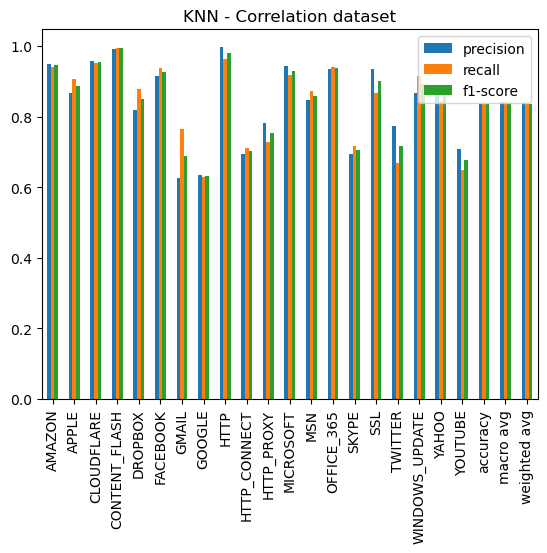

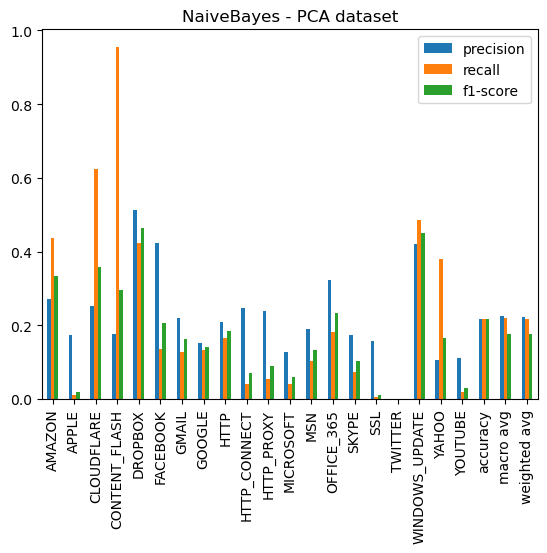

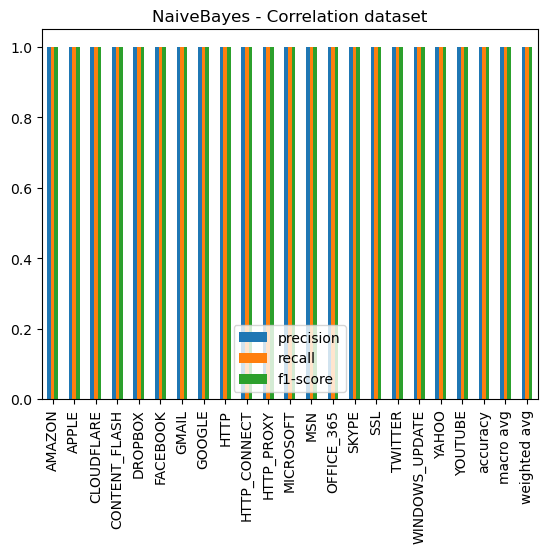

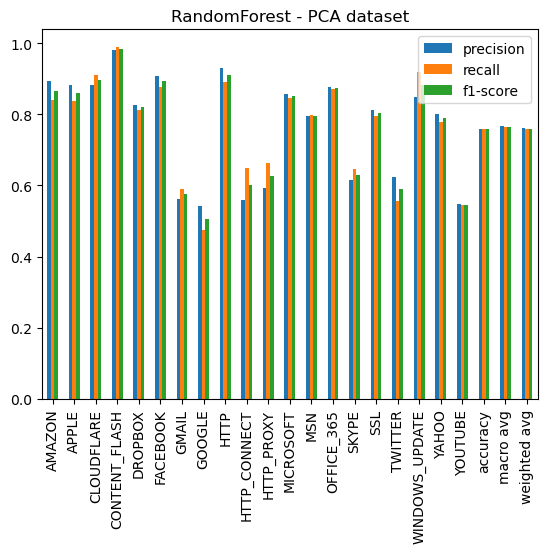

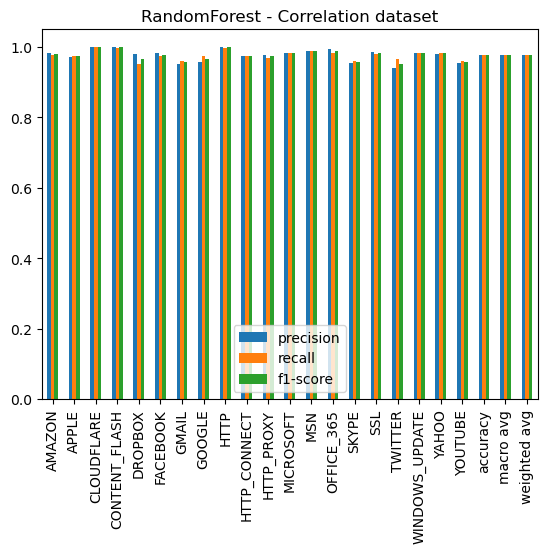

In [69]:
def dcr_plot(ytest, pred, title, fig):
    classes = le.classes_.tolist()
    report = classification_report(ytest, pred, target_names=classes, output_dict=True)
    # Convert the classification report to a DataFrame for formatting
    df_report = pd.DataFrame(report).transpose()
    df_report = df_report.style.set_caption(title)
    ax = df_report.data[['precision','recall','f1-score']].plot.bar()
    ax.set_title(title)
    ax.figure.savefig('images/' + fig + '.png')

dcr_plot(y_test, lr_pred, 'Logistic Regression - PCA dataset', 'lr-pca-v')
dcr_plot(y_test_corr, lr_corr_pred, 'Logistic Regression - Correlation dataset', 'lr-corr-v')
dcr_plot(y_test, dt_pred, 'DecisionTree - PCA dataset', 'dt-pca-v')
dcr_plot(y_test_corr, dt_corr_pred, 'DecisionTree - Correlation dataset', 'dt-corr-v')
dcr_plot(y_test, svm_pred, 'SVM - PCA dataset', 'svm-pca-v')
dcr_plot(y_test_corr, svm_corr_pred, 'SVM - Correlation dataset', 'svm-corr-v')
dcr_plot(y_test, knn_pred, 'KNN - PCA dataset', 'knn-pca-v')
dcr_plot(y_test_corr, knn_corr_pred, 'KNN - Correlation dataset', 'knn-corr-v')
dcr_plot(y_test, nb_pred, 'NaiveBayes - PCA dataset', 'nb-pca-v')
dcr_plot(y_test_corr, nb_corr_pred, 'NaiveBayes - Correlation dataset', 'nb-corr-v')
dcr_plot(y_test, rf_pred, 'RandomForest - PCA dataset', 'rfc-pca-v')
dcr_plot(y_test_corr, rf_corr_pred, 'RandomForest - Correlation dataset', 'rfc-corr-v')